# Определение стоимости автомобилей

**Описание проекта.**

Сервис по продаже автомобилей с пробегом «Не бит, не крашен» разрабатывает приложение для привлечения новых клиентов. В нём можно быстро узнать рыночную стоимость своего автомобиля. В вашем распоряжении исторические данные: технические характеристики, комплектации и цены автомобилей. Вам нужно построить модель для определения стоимости. 

Заказчику важны:
- качество предсказания;
- скорость предсказания;
- время обучения.


**Описание данных.**

В нашем распоряжении информация с техническими характеристиками и стоимостью автомобилей.  
*Признаки:*
* DateCrawled — дата скачивания анкеты из базы
* VehicleType — тип автомобильного кузова
* RegistrationYear — год регистрации автомобиля
* Gearbox — тип коробки передач
* Power — мощность (л. с.)
* Model — модель автомобиля
* Kilometer — пробег (км)
* RegistrationMonth — месяц регистрации автомобиля
* FuelType — тип топлива
* Brand — марка автомобиля
* Repaired — была машина в ремонте или нет
* DateCreated — дата создания анкеты
* NumberOfPictures — количество фотографий автомобиля
* PostalCode — почтовый индекс владельца анкеты (пользователя)
* LastSeen — дата последней активности пользователя

*Целевой признак:*
* Price — цена (евро)


**План работы.**

1. Загружаем данные их файла *autos.csv*.  
2. Изучаем данные. Заполняем пропущенные значения и обработаем аномалии в признаках. Если среди признаков имеются неинформативные, удалим их.  
3. Готовим выборки для обучения моделей.  
4. Обучаем разные модели, одна из которых — LightGBM, как минимум одна — не бустинг. Для каждой модели пробуем разные гиперпараметры.  
5. Анализируем время обучения, время предсказания и качество моделей.  
6. Опираясь на критерии заказчика, выбираем лучшую модель, проверяем её качество на тестовой выборке.


**Инструкция по выполнению проекта.**

Чтобы усилить исследование, не ограничивайтесь градиентным бустингом. Попробуйте более простые модели — иногда они работают лучше. Эти редкие случаи легко пропустить, если всегда применять только бустинг. 

Поэкспериментируйте и сравните характеристики моделей: время обучения, время предсказания, точность результата.


**Примечания:**
* Для оценки качества моделей применяйте метрику RMSE.
* Значение метрики RMSE должно быть меньше 2500.
* Самостоятельно освойте библиотеку LightGBM и её средствами постройте модели градиентного бустинга.
* Время выполнения ячейки кода Jupyter Notebook можно получить специальной командой. Найдите её.
* Модель градиентного бустинга может долго обучаться, поэтому измените у неё только два-три параметра.
* Если перестанет работать Jupyter Notebook, удалите лишние переменные оператором del. Пример: del features_train.

## Подготовка данных.

In [1]:
#!pip install lightgbm
#!pip install catboost
#!pip install ipywidgets
#!pip install -U xgboost
!pip install skimpy

In [2]:
# Все import соберем в начале проекта:
import warnings
warnings.filterwarnings('ignore')

import matplotlib
%matplotlib inline

import time
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import xgboost as xgb

from skimpy import clean_columns
from lightgbm import LGBMRegressor
from lightgbm import plot_importance
from catboost import CatBoostRegressor

from tqdm.auto import tqdm
from sklearn.model_selection import GridSearchCV, train_test_split
from sklearn.preprocessing import OrdinalEncoder, StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import mean_squared_error
from sklearn.ensemble import (RandomForestRegressor,
                              GradientBoostingRegressor)
from sklearn.dummy import DummyRegressor


RANDOM_FIX_NUMBER = 12345  # Введем глобальную переменную для значения random_state
STATE = np.random.RandomState(RANDOM_FIX_NUMBER)

# Сброс ограничений на количество символов в записи
pd.set_option('display.max_colwidth', None)
# Настроим, чтобы числа в датасетах отражались с 1 знаком после запятой;
pd.set_option('display.float_format', '{:.1f}'.format) 
# вернуть настройки к дефолтным:
# pd.reset_option('all')


%config InlineBackend.figure_format = 'svg'

### Загрузка локального и удаленного файла с данными:

Изучили файл с предоставленными данными autos.csv и применяем символ запятая для разделения данных:

In [3]:
dataset_remote_path = 'https://code.s3.yandex.net/datasets/autos.csv'

dataset_local_path = 'datasets/autos.csv'

try:
    data = pd.read_csv(dataset_local_path, sep=',')
    print('Local datasets is loaded successfully.')
except:
    data = pd.read_csv(dataset_remote_path, sep=',')
    print('Remote datasets is loaded successfully.')

Local datasets is loaded successfully.


### Изучим датасет.

#### Размер данных в изучаемом файле:

In [4]:
data.shape, data.size

((354369, 16), 5669904)

Набор данных довольно большой: 354 369 строк х 16 столбцов.
    
Сохраним начальное значение количества объектов:

In [5]:
initial_size = data.shape[0]
initial_size

354369

In [6]:
# Сделаем функцию расчета количества оставшихся после сокращений объектов:
def check_number_objects():
    print(f'Количество объектов в изначальном датасете: \
{initial_size:_d} шт.')
    print(f'Количество объектов в текущем датасете: \
{data.shape[0]:_d} шт.')
    print(f'После всех сокращений осталось: \
{data.shape[0] / initial_size:.2%}')

#### Проверка на соответствие названий столбцов стилю snake_case

In [7]:
columns_name = data.columns.tolist()
print(columns_name)

['DateCrawled', 'Price', 'VehicleType', 'RegistrationYear', 'Gearbox', 'Power', 'Model', 'Kilometer', 'RegistrationMonth', 'FuelType', 'Brand', 'Repaired', 'DateCreated', 'NumberOfPictures', 'PostalCode', 'LastSeen']


Видим, что наименования столбцов нужно поправить для приведения к стилю snake_case.  

In [8]:
# Почистим названия столбцов
columns_name = clean_columns(data).columns.tolist()
data.columns = columns_name
print(columns_name)

16 column names have been cleaned

['date_crawled', 'price', 'vehicle_type', 'registration_year', 'gearbox', 'power', 'model', 'kilometer', 'registration_month', 'fuel_type', 'brand', 'repaired', 'date_created', 'number_of_pictures', 'postal_code', 'last_seen']


Все в порядке. Названия столбцов соответствуют стилю snake_case.

#### Поиск дубликатов 

In [9]:
data.duplicated().sum()

4

Видим, что дубликатов всего 4 при количестве обектов более 354 тысячи. Их можно смело удалить.

In [10]:
data = data.drop_duplicates()
data.shape

(354365, 16)

#### Информация, содержащаяся в столбцах:

In [11]:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 354365 entries, 0 to 354368
Data columns (total 16 columns):
 #   Column              Non-Null Count   Dtype 
---  ------              --------------   ----- 
 0   date_crawled        354365 non-null  object
 1   price               354365 non-null  int64 
 2   vehicle_type        316875 non-null  object
 3   registration_year   354365 non-null  int64 
 4   gearbox             334532 non-null  object
 5   power               354365 non-null  int64 
 6   model               334660 non-null  object
 7   kilometer           354365 non-null  int64 
 8   registration_month  354365 non-null  int64 
 9   fuel_type           321470 non-null  object
 10  brand               354365 non-null  object
 11  repaired            283211 non-null  object
 12  date_created        354365 non-null  object
 13  number_of_pictures  354365 non-null  int64 
 14  postal_code         354365 non-null  int64 
 15  last_seen           354365 non-null  object
dtypes:

Видим, что в нашем датасете есть и количественные и категориальные признаки.

Но есть и неинформативные признаки. Вряд ли они влияют на стоимость авто:
* date_crawled - дата скачивания анкеты из базы,
* registration_month - месяц регистрации автомобиля,
* date_created - дата создания анкеты,
* number_of_pictures - количество фотографий автомобиля,
* postal_code - почтовый индекс владельца анкеты (пользователя),
* last_seen - дата последней активности пользователя.

Прежде, чем их удалять, посмотрим их:

In [12]:
print('\nСамая РАННЯЯ дата скачивания анкеты из базы:',
      data.date_crawled.min())
print('Самая ПОЗДНЯЯ дата скачивания анкеты из базы:',
      data.date_crawled.max())

print('\nСамая РАННЯЯ дата создания анкеты:',
      data.date_created.min())
print('Самая ПОЗДНЯЯ дата создания анкеты:',
      data.date_created.max())


Самая РАННЯЯ дата скачивания анкеты из базы: 2016-03-05 14:06:22
Самая ПОЗДНЯЯ дата скачивания анкеты из базы: 2016-04-07 14:36:58

Самая РАННЯЯ дата создания анкеты: 2014-03-10 00:00:00
Самая ПОЗДНЯЯ дата создания анкеты: 2016-04-07 00:00:00


Интересно! *Самые поздние анкеты датируются 07 апреля 2016 года.*  
Возможно, это пригодится в дальнейшем.

#### Удалим неинформативные признаки:

In [13]:
data = data.drop(['date_crawled', 'registration_month', 'date_created', 
                  'number_of_pictures', 'postal_code', 'last_seen'], axis=1)
# Посмотрим обновленный датасет:
data.head(2)

,price,vehicle_type,registration_year,gearbox,power,model,kilometer,fuel_type,brand,repaired
0,480,NaN,1993,manual,0,golf,150000,petrol,volkswagen,NaN
1,18300,coupe,2011,manual,190,NaN,125000,gasoline,audi,yes


#### Количественные признаки.

In [14]:
# Описание количественных признаков:
data.describe()

,price,registration_year,power,kilometer
count,354365.0,354365.0,354365.0,354365.0
mean,4416.7,2004.2,110.1,128211.4
std,4514.2,90.2,189.9,37905.1
min,0.0,1000.0,0.0,5000.0
25%,1050.0,1999.0,69.0,125000.0
50%,2700.0,2003.0,105.0,150000.0
75%,6400.0,2008.0,143.0,150000.0
max,20000.0,9999.0,20000.0,150000.0


##### Изучим признак *'price'.  
Это важно, так как *'price'* - целевой признак.  
Отмечаем:
1) большую разницу между средним (4_416.7) и медианным (2_700) значениями. Значит, есть аномально высокие значения.
2) Наличие нулевых значений цены, что несет явную ошибку.

In [15]:
# Для изучения присутствия аномальных значений,  
# построим диаграмму размаха, или 'ящик с усами"

box_mustache_info = {
    'price': 
     ['Распределение по стоимости автомобиля.', 
      'Цена автомобиля.'],
      
      'registration_year': 
     ['Распределение по годам регистрации автомобиля.',
      'Год регистрации.'],      
      
      'power': 
     ['Распределение по мощности двигателя автомобиля.', 
      'Мощность двигателя (л.с.).'],
      
      'kilometer': 
     ['Распределение по пробегу автомобиля.', 
      'Пробег (км.).'],      
    }

def box_mustache(column_name):

    data.boxplot(column=column_name, figsize=(6, 3))
    plt.title(box_mustache_info[column_name][0], color = 'blue')
    #plt.xlabel('Признак: '+ column_name, color = 'blue')
    plt.ylabel(box_mustache_info[column_name][1], color = 'blue')
    plt.show()

In [16]:
# Изучим присутствие аномальных значений, 
# построив диаграмму размаха, или 'ящик с усами"
box_mustache('price') 

Сам факт существования значений цены в диапазоне 15_000 - 20_000 не кажется аномальным. 

In [17]:
# Посчитаем количество значений цены выше 15_000:
data.query('price>15000')['price'].count()

14881

Значений признака *'price'*, превышающих 15_000 довольно много. Оставим их.

Посмотрим значения, равные или близкие к 0:

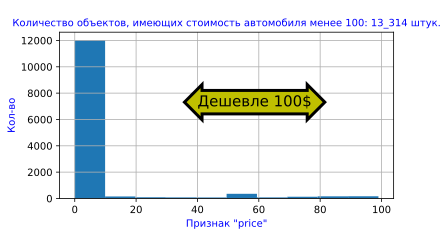

In [18]:
# Изучим распределение по ценам, меньшим 100:
price_level = 100
data_low_price = data.query(f'price<{price_level}')['price']
data_low_price.hist(figsize=(6, 3));

message = '\nКоличество объектов, имеющих стоимость автомобиля менее'
plt.title(f'{message} {price_level}: {data_low_price.count():_d} штук.', 
          color = 'blue', size = 10)
plt.xlabel('Признак "price"', color = 'blue')
plt.ylabel('Кол-во', color = 'blue')
bbox_properties=dict(boxstyle='darrow, pad=0.3', ec='k', fc='y', ls='-',
lw=3)
text_my = f'Дешевле {price_level}$'
plt.text(40, 7000, text_my, fontsize=15, bbox=bbox_properties)
plt.show()

Отмечаем, что наибольшую часть представляют значения, меньшие 10.

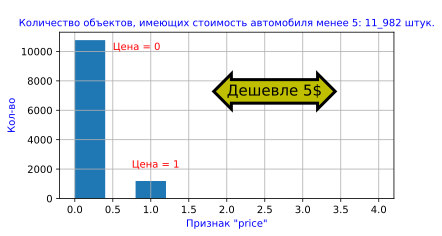

In [19]:
price_level = 5
data_low_price = data.query(f'price<{price_level}')['price']
data_low_price.hist(figsize=(6, 3));

message = '\nКоличество объектов, имеющих стоимость автомобиля менее'
plt.title(f'{message} {price_level}: {data_low_price.count():_d} штук.', 
          color = 'blue', size = 10)
plt.xlabel('Признак "price"', color = 'blue')
plt.ylabel('Кол-во', color = 'blue')
plt.text(0.5, 10100, 'Цена = 0', color = 'red')
plt.text(0.75, 2100,  'Цена = 1', color = 'red')
#plt.legend(fontsize=14, shadow=True, title='Легенда')
bbox_properties=dict(boxstyle='darrow, pad=0.3', ec='k', fc='y', ls='-',
lw=3)
text_my = f'Дешевле {price_level}$'
plt.text(2, 7000, text_my, fontsize=15, bbox=bbox_properties)
plt.show()

Видно, что аномальными являются значения стоимости автомобиля равные 0 и 1.
Может, они и реальны, потому что такие автомобили предлагаются, допустим для разборки на запчасти, утилизации и т.д.  
Для предсказаний реальной цены авто такие значения нам не нужны. Уберем их все, вплоть до цены 100.

In [20]:
data = data[data.price >100]
data.price.describe()

count   340020.0
mean      4602.5
std       4514.9
min        101.0
25%       1200.0
50%       2900.0
75%       6500.0
max      20000.0
Name: price, dtype: float64

Хорошо. С признаком *'стоимость автомобиля'* разобрались.

##### Изучим признак 'registration_year' - год постановки автомобиля на учёт.

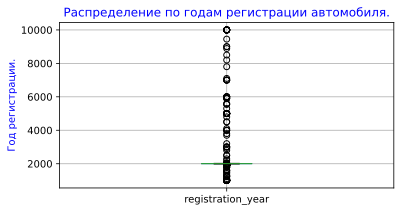

In [21]:
# Изучим присутствие аномальных значений, 
# построив диаграмму размаха, или 'ящик с усами"
box_mustache('registration_year') 

Отмечаем огромное количество нереальных значений года постановки авто на учёт.

**Изучим ранние значения года регистрации автомомбиля.**

In [22]:
year_level = 1920
data.query(f'registration_year<{year_level}')\
          ['registration_year'].value_counts()

1910    34
1000    22
1800     4
1234     3
1500     2
1600     2
1300     2
1400     1
1001     1
1111     1
1039     1
1602     1
Name: registration_year, dtype: int64

Видим, что аномальными являются значения года регистрации автомобиля ранее 1910 года.  
Такие данные не понятно, как корректировать. Вследствие их малочисленности удалим их.

**Изучим поздние значения года регистрации автомобиля.**

Ранее установлен самый поздний срок создания анкеты: 2016-04-07. Поэтому 

In [23]:
year_level = 2016
data.query(f'registration_year>{year_level}')\
          ['registration_year'].value_counts()

2017    9823
2018    3765
2019      14
5000      13
9999      13
6000       5
3000       4
7000       4
4000       3
5555       2
2500       2
4500       2
9000       2
5911       2
8888       1
9450       1
2800       1
5600       1
7800       1
7100       1
2290       1
8500       1
4800       1
3800       1
3700       1
2200       1
3200       1
5900       1
2900       1
5300       1
2066       1
4100       1
8200       1
Name: registration_year, dtype: int64

Посмотрел автомобили, с регистрацией по базе после 2016 года.
Настолько много различных вариантов комплектаций существует, что достоверно нельзя установить год выпуска авто.
Будем удалять.

**Удалим объекты с датами регистрации автомобилей до 1910 и после 2016**

In [24]:
data.shape

(340020, 10)

In [25]:
data = data.drop(data.query('registration_year<1910 or \
                            registration_year>2016').index)
data.shape

(326307, 10)

##### Изучим признак 'power'.

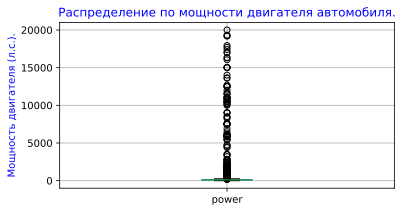

In [26]:
# Изучим присутствие аномальных значений, 
# построив диаграмму размаха, или 'ящик с усами"
box_mustache('power')

Отмечаем большое количество аномальных значений. Так ничего не понятно.

Рассмотрим это распределение по другому графику:

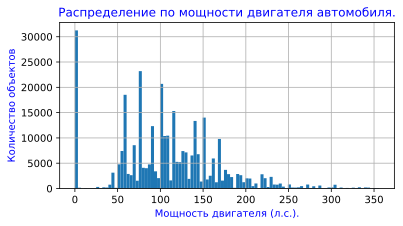

In [27]:
# Рассчитаем квантили распределения признака 'power':
Q1 = data['power'].quantile(0.25)
Q3 = data['power'].quantile(0.75)
IQR = Q3 - Q1
#data['power'].plot(kind = 'hist', bins = 100, grid = True, 
#                   range = (0, Q3 + 3*IQR), figsize = (6, 3));

data['power'].plot(kind = 'hist', bins = 100, grid = True, 
                   range = (0, Q3 + 3*IQR), figsize = (6, 3));


plt.title('Распределение по мощности двигателя автомобиля.', color = 'blue')
plt.xlabel('Мощность двигателя (л.с.).', color = 'blue')
plt.ylabel('Количество объектов', color = 'blue')
plt.show()

Аномальные значения 'power' выше 350 л.с. удалим.

In [28]:
data = data.query('power <= 350')

Рассмотрим значения 'power', близкие к 0:

In [29]:
power_level = 5
data.query(f'power<{power_level}')\
           ['power'].value_counts()

0    31209
4       30
1       23
2        9
3        8
Name: power, dtype: int64

Отмечаем огромное количество нулевых значений. Просто удалить их нельзя. Их много. около 10% выборки.

Попробуем нулевые значения заменить медианными относительно брендов.

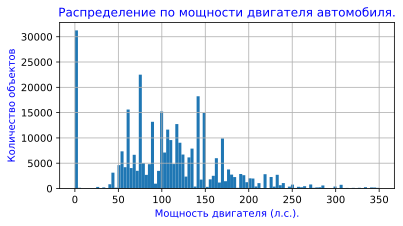

In [30]:
data['power'] = data['power'].fillna(data.groupby(by=['brand'])['power'].transform('median'))

data['power'].plot(kind = 'hist', bins = 100, grid = True, 
                   figsize = (6, 3));

plt.title('Распределение по мощности двигателя автомобиля.', color = 'blue')
plt.xlabel('Мощность двигателя (л.с.).', color = 'blue')
plt.ylabel('Количество объектов', color = 'blue')
plt.show()

Хорошо. Нулевые значения заменили.

##### Изучим признак 'kilometer' - пробег автомобиля.

In [31]:
# Изучим присутствие аномальных значений, 
# построив диаграмму размаха, или 'ящик с усами"
box_mustache('kilometer')

Наблюдаем небольшое количество аномальных значений, менее 90 000 км.

Изучим из подробнее.

In [32]:
data['kilometer'].value_counts()

150000    217479
125000     34105
100000     13827
90000      10971
80000       9549
70000       8216
60000       7187
50000       5961
40000       4743
5000        4343
30000       4181
20000       3627
10000       1027
Name: kilometer, dtype: int64

Отмечаем: 
* значения пробегов находятся в диапазоне 5_000 - 150_000 км.
* они распределены с шагом 10 и 25 тыс км.

Все значения приемлемы. Коррекция не нужна.

In [33]:
data.describe()

,price,registration_year,power,kilometer
count,325216.0,325216.0,325216.0,325216.0
mean,4636.3,2002.6,108.5,128354.8
std,4525.7,6.9,60.6,37220.5
min,101.0,1910.0,0.0,5000.0
25%,1222.0,1999.0,71.0,125000.0
50%,2950.0,2003.0,105.0,150000.0
75%,6699.0,2007.0,143.0,150000.0
max,20000.0,2016.0,350.0,150000.0


##### Визуальная оценка нормальности распределений количественных признаков

Построим общую диаграмму для всех признаков:

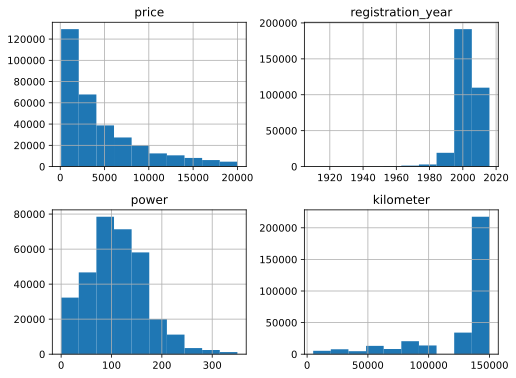

In [34]:
data.hist(figsize=(8, 6));

Признаки имеют скошенное нормальное распределение

##### Изучим количественные признаки на мультиколлинеарность.

Посмотрим взаимную корреляцию признаков датасета:

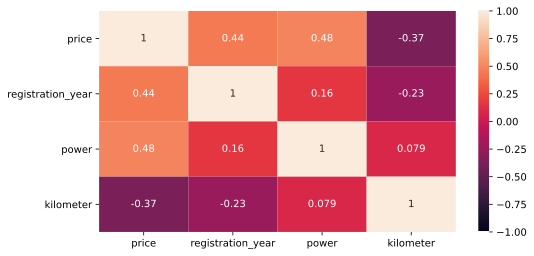

In [35]:
plt.figure(figsize = (8,4))
_ = sns.heatmap(data.corr(), vmax=1, vmin=-1, annot=True)

Отмечаем:
* умереное влияние *power* - мощности двигателя на стоимость авто. Это разумно. Мощнее двигатель автомобиля - больше его стоимость.
* незначительную обратную корреляции между признаками *kilometer* и *price*. Тоже вполне понятно. Чем больше пробег, тем ниже стоимость.

#### Изучим зависимость количественных и целевого признаков.

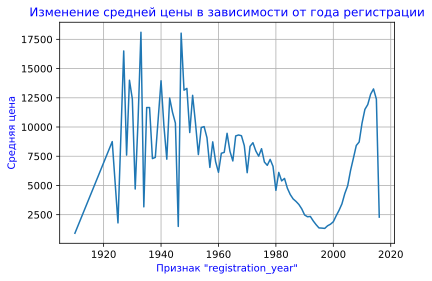

In [36]:
def price_dependence(priznak, title):
    mean_price = data[[priznak, 'price']].groupby(priznak, \
                      as_index=False).mean().astype('int')
    plt.figure(figsize=(6,4))
    plt.grid(axis = 'both')
    sns.lineplot(x=priznak, y='price', data=mean_price)
    plt.xlabel(f'Признак "{priznak}"', color='blue')
    plt.ylabel('Средняя цена', color='blue')
    plt.title(title, color='blue', size=12)
    plt.show()
    
price_dependence('registration_year', \
                'Изменение средней цены в зависимости от года регистрации')    

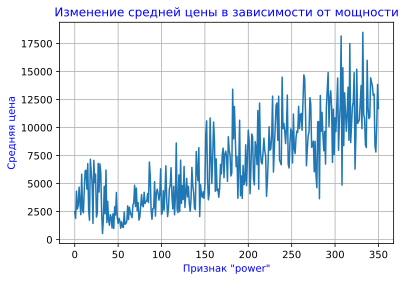

In [37]:
price_dependence('power', \
                 'Изменение средней цены в зависимости от мощности')

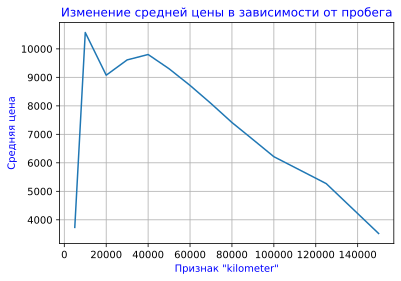

In [38]:
price_dependence('kilometer', \
                 'Изменение средней цены в зависимости от пробега')

Промежуточные выводы:  
1. Странно, но с годами средняя цена автомобиля в мире не растет.  
2. Вполне понятное увеличение средней стоимости авто при увеличении мощности двигателя.  
3. Стоимость автомобиля сильно падает с увеличением пробега.

#### Категориальные признаки.

In [39]:
# Посмотрим, какого типа признаки есть в нашем датасете:
data.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 325216 entries, 0 to 354368
Data columns (total 10 columns):
 #   Column             Non-Null Count   Dtype 
---  ------             --------------   ----- 
 0   price              325216 non-null  int64 
 1   vehicle_type       306708 non-null  object
 2   registration_year  325216 non-null  int64 
 3   gearbox            310869 non-null  object
 4   power              325216 non-null  int64 
 5   model              310289 non-null  object
 6   kilometer          325216 non-null  int64 
 7   fuel_type          302535 non-null  object
 8   brand              325216 non-null  object
 9   repaired           267484 non-null  object
dtypes: int64(4), object(6)
memory usage: 27.3+ MB


In [40]:
# выделим только категориальные признаки:
cat_columns_name = data.select_dtypes(include=['object']).columns.tolist()
print(cat_columns_name)

['vehicle_type', 'gearbox', 'model', 'fuel_type', 'brand', 'repaired']


In [41]:
data[['vehicle_type', 'gearbox', 'model', 'fuel_type', 'brand', 'repaired']]

,vehicle_type,gearbox,model,fuel_type,brand,repaired
0,NaN,manual,golf,petrol,volkswagen,NaN
1,coupe,manual,NaN,gasoline,audi,yes
2,suv,auto,grand,gasoline,jeep,NaN
3,small,manual,golf,petrol,volkswagen,no
4,small,manual,fabia,gasoline,skoda,no
...,...,...,...,...,...,...
354363,bus,manual,zafira,petrol,opel,no
354365,NaN,NaN,NaN,NaN,sonstige_autos,NaN
354366,convertible,auto,fortwo,petrol,smart,no
354367,bus,manual,transporter,gasoline,volkswagen,no


In [42]:
data.isna().sum()

price                    0
vehicle_type         18508
registration_year        0
gearbox              14347
power                    0
model                14927
kilometer                0
fuel_type            22681
brand                    0
repaired             57732
dtype: int64

**Видим большое количество пропусков в категориальных данных.**

Посмотрим каждый признак отдельно.

In [43]:
# сделаем програмку для печати информации по составу 
# признаков и количеству пустых значений

def print_category_priznak(column):
    print('\nСписок значений признака', column, ':')
    print(data[column].value_counts())

    print('\nКоличество пропущенных значений:', 
          data[column].isna().sum())  

**Признак *vehicle_type — тип автомобильного кузова*.**

In [44]:
print_category_priznak('vehicle_type')  


Список значений признака vehicle_type :
sedan          88533
small          76934
wagon          63195
bus            28228
convertible    19763
coupe          15373
suv            11663
other           3019
Name: vehicle_type, dtype: int64

Количество пропущенных значений: 18508


Отмечаем для признака *vehicle_type — тип автомобильного кузова*:
* 18_508 пропущенных значений.
* 3_019 значений *other*

Заменим пропуски значенем *other*:

In [45]:
data['vehicle_type'] = data['vehicle_type'].fillna('other')
print_category_priznak('vehicle_type')  


Список значений признака vehicle_type :
sedan          88533
small          76934
wagon          63195
bus            28228
other          21527
convertible    19763
coupe          15373
suv            11663
Name: vehicle_type, dtype: int64

Количество пропущенных значений: 0


**Признак *model — модель автомобиля*.**

In [46]:
print_category_priznak('model')  


Список значений признака model :
golf                  26452
other                 22742
3er                   18534
polo                  11811
corsa                 11321
                      ...  
kalina                    6
rangerover                3
serie_3                   3
range_rover_evoque        2
serie_1                   1
Name: model, Length: 250, dtype: int64

Количество пропущенных значений: 14927


Отмечаем для признака *model — модель автомобиля*:
* 14_927 пропущенных значений.
* 22_742 значений *other*

Заменим пропуски значенем *other*:

In [47]:
data['model'] = data['model'].fillna('other')
print_category_priznak('model')  


Список значений признака model :
other                 37669
golf                  26452
3er                   18534
polo                  11811
corsa                 11321
                      ...  
kalina                    6
rangerover                3
serie_3                   3
range_rover_evoque        2
serie_1                   1
Name: model, Length: 250, dtype: int64

Количество пропущенных значений: 0


**Признак *fuel_type — тип топлива*.**

In [48]:
print_category_priznak('fuel_type')


Список значений признака fuel_type :
petrol      202067
gasoline     94520
lpg           4973
cng            527
hybrid         219
other          146
electric        83
Name: fuel_type, dtype: int64

Количество пропущенных значений: 22681


Отмечаем для признака *fuel_type — модель автомобиля*:
* 202_067 значений *petrol*,
* 94_520 значений *gasoline*,
* 22_681 значений *other*.

Так как petrol и gasoline - это все бензин )Европа и Северная Америка),
заменим все на *petrol*, включая пропуски:

In [49]:
data['fuel_type'] = data['fuel_type'].fillna('petrol')
data['fuel_type'] = data['fuel_type'].replace('gasoline', 'petrol')
print_category_priznak('fuel_type')


Список значений признака fuel_type :
petrol      319268
lpg           4973
cng            527
hybrid         219
other          146
electric        83
Name: fuel_type, dtype: int64

Количество пропущенных значений: 0


**Признак *brand — марка автомобиля*.**

In [50]:
data['brand'].isna().sum()

0

In [51]:
data['brand'].unique()

array(['volkswagen', 'audi', 'jeep', 'skoda', 'bmw', 'peugeot', 'ford',
       'mazda', 'nissan', 'renault', 'mercedes_benz', 'seat', 'honda',
       'fiat', 'opel', 'mini', 'smart', 'hyundai', 'alfa_romeo', 'subaru',
       'volvo', 'mitsubishi', 'kia', 'suzuki', 'lancia', 'citroen',
       'sonstige_autos', 'toyota', 'chevrolet', 'dacia', 'daihatsu',
       'chrysler', 'jaguar', 'daewoo', 'rover', 'porsche', 'saab',
       'trabant', 'land_rover', 'lada'], dtype=object)

Видим, что:
* пропущенных значений нет,
* все значения корректные.

**Признак *gearbox — тип коробки передач*.**

In [52]:
print_category_priznak('gearbox')


Список значений признака gearbox :
manual    248785
auto       62084
Name: gearbox, dtype: int64

Количество пропущенных значений: 14347


**Признак *repaired — была машина в ремонте или нет*.**

In [53]:
print_category_priznak('repaired')


Список значений признака repaired :
no     235572
yes     31912
Name: repaired, dtype: int64

Количество пропущенных значений: 57732


Отмечаем, что признаки 'gearbox' и 'repaired' являются бинарными.

Переведем бинарные признаки в количественные, присвоив им значения '0' и '1'
Но сначала заполним пропуски в признаках 'gearbox' и 'repaired' случайными числами '0' или '1'. Применим функцию randint().

In [54]:
for col in ['gearbox', 'repaired']:
    data[col] = data[col].fillna(pd.Series(
        np.random.randint(0, 2, size=len(data)), index=data.index))
    print_category_priznak(col)


Список значений признака gearbox :
manual    248785
auto       62084
0           7178
1           7169
Name: gearbox, dtype: int64

Количество пропущенных значений: 0

Список значений признака repaired :
no     235572
yes     31912
0       28902
1       28830
Name: repaired, dtype: int64

Количество пропущенных значений: 0


Преобразуем категориальные значения признаков 'gearbox' и 'repaired' в числа "0" и "1" и изменим тип данных у этих признаков на *int64*:

In [55]:
data['gearbox'] = data['gearbox'].replace('manual', 0)
data['gearbox'] = data['gearbox'].replace('auto', 1)
data['gearbox'] = data['gearbox'].astype('int64')

data['repaired'] = data['repaired'].replace('no', 0)
data['repaired'] = data['repaired'].replace('yes', 1)
data['repaired'] = data['repaired'].astype('int64')

# Проверим, что получилось:
for col in ['gearbox', 'repaired']:
    print_category_priznak(col)


Список значений признака gearbox :
0    255963
1     69253
Name: gearbox, dtype: int64

Количество пропущенных значений: 0

Список значений признака repaired :
0    264474
1     60742
Name: repaired, dtype: int64

Количество пропущенных значений: 0


#### Проверка количества оставшихся после всех сокращений данных.

In [56]:
check_number_objects()

Количество объектов в изначальном датасете: 354_369 шт.
Количество объектов в текущем датасете: 325_216 шт.
После всех сокращений осталось: 91.77%


Отмечаем, что сохранено более 90% данных. Количество сокращений признаем удовлетворительным.

### Промежуточные выводы по разделу 'Подготовка данных'.

Для подготовки данных к последующей обработке были проведены следующие операции:

1. Загрузка локального и удаленного файла с данными.
2. Выяснили, что объем данных довольно большой: 354 369 строк х 16 столбцов.
3. Названия столбцов откорректированы и приведены к стилю *snake_case*.
4. Дубликаты в количестве 4 штуки исключены.
5. Удалены неинформативные признаки.
6. Изучены количественные признаки. Аномальные значения удалены.
7. Проверены категориальные признаки. Пустые значения заполнены.
8. Проведено кодирование категориальных принаков (перевод в численные).
9. Выполнено масштабирование численных признаков.
10. Проверка количества оставшихся после всех сокращений данных. Сохранено более 90% данных.

## Обучение моделей.

### Разделим исходные данные на обучающую и тестовую выборки в пропорции 4:1.

In [57]:
features = data.drop('price', axis=1)
target = data['price']

features_train, features_test, target_train, target_test = \
    train_test_split(features, target, test_size=0.20, 
                     random_state=RANDOM_FIX_NUMBER)

In [58]:
print('\nПроверим данные после разбиения на выборки, нет ли потерь:\n')

if( data.shape[0] == (features_train.shape[0] + features_test.shape[0])):
    print('После разделения дфтфсета в обучающей выборке потерь нет.')
else:
    print('ВНИМАНИЕ! Есть потеря данных в обучающей выборке.\n' \
          'Сумма количества объектов в обучающей выборке НЕ равно ' \
          'количеству объектов исходного датасета.')
    print(data.shape[0], features_train.shape[0] + features_test.shape[0])
    
if( data.shape[0] == (target_train.shape[0] + target_test.shape[0])):
    print('После разделения дфтфсета в тестовой выборке потерь нет.')
else:
    print('ВНИМАНИЕ! Есть потеря данных в тестовой выборке.\n' \
          'Сумма количества объектов в тестовой выборке НЕ равно ' \
          'количеству объектов исходного датасета.')
    print(data.shape[0], target_train.shape[0] + target_test.shape[0])


Проверим данные после разбиения на выборки, нет ли потерь:

После разделения дфтфсета в обучающей выборке потерь нет.
После разделения дфтфсета в тестовой выборке потерь нет.


**Кодирование категориальных принаков обучающей выборки.**

Преобразуем категориальные признаки в численные ТОЛЬКО ДЛЯ ОБУЧАЮЩЕЙ ВЫБОРКИ.

In [59]:
# выделим категориальные признаки:
cat_col = features_train.select_dtypes(include=['object']).columns.tolist()
print(cat_col)

['vehicle_type', 'model', 'fuel_type', 'brand']


In [60]:
# Посмотрим список исходных категориальных признаков:
features_train[cat_col].sample(5)

,vehicle_type,model,fuel_type,brand
318689,suv,sportage,petrol,kia
55057,small,1_reihe,petrol,peugeot
322778,sedan,focus,petrol,ford
297387,suv,niva,petrol,lada
112272,convertible,megane,petrol,renault


In [61]:
# Создаём объект новой структуры данных:
encoder = OrdinalEncoder() 

# Получаем список категориальных признаков, вызывая метод fit()
# Передаём ему данные как аргумент.
encoder.fit(features_train[cat_col])

# Преобразуем данные функцией transform():
features_train[cat_col] = encoder.transform(features_train[cat_col])
features_test[cat_col] = encoder.transform(features_test[cat_col])

# Посмотрим список оцифрованных категориальных признаков:
features_train.sample(5)

,vehicle_type,registration_year,gearbox,power,model,kilometer,fuel_type,brand,repaired
70444,4.0,2007,1,200,29.0,90000,5.0,1.0,0
247972,5.0,2000,1,75,8.0,150000,5.0,25.0,0
109511,7.0,2011,0,170,31.0,150000,5.0,1.0,0
44344,3.0,2000,0,0,52.0,150000,5.0,26.0,0
341611,1.0,2001,1,218,76.0,150000,5.0,20.0,0


#### Масштабирование численных признаков обучающей выборки.

Отмечаем, что у наших численных признаков сильно отличающийся масштаб. Есть значения даже в сотни тысяч.   
Чтобы при последующей обработке такие высокие цифры не воспринимались, как более важные признаки, проведем их к одному масштабу. 

In [63]:
# Создадим список из названий столбцов для масштабирования:
columns_name = ['registration_year', 'power', 'kilometer'] 
columns_name

['registration_year', 'power', 'kilometer']

In [64]:
# Преобразуем данные с помощью StandardScaler.

# Создадим объект структуры StandardScaler:
scaler = StandardScaler()

# Настроим объект на обучающих данных:
scaler.fit(features_train[columns_name]) 

# Преобразуем функцией transform():
features_train[columns_name] = scaler.transform(features_train[columns_name])  
features_test[columns_name] = scaler.transform(features_test[columns_name]) 

# Проверим полный список признаков:
features_train.sample(5)

,vehicle_type,registration_year,gearbox,power,model,kilometer,fuel_type,brand,repaired
27622,6.0,0.8,1,0.5,219.0,0.6,5.0,38.0,0
5572,7.0,0.6,0,-1.8,142.0,-0.1,5.0,6.0,0
221845,4.0,0.9,0,0.2,53.0,-0.8,5.0,9.0,0
40197,5.0,0.3,0,-0.7,113.0,-1.8,5.0,12.0,0
142328,7.0,-0.2,1,1.2,166.0,0.6,5.0,1.0,0


Видим, что ничего не упустили.

Проверим типы данных наших признаков:

In [65]:
features_train.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 260172 entries, 314019 to 237127
Data columns (total 9 columns):
 #   Column             Non-Null Count   Dtype  
---  ------             --------------   -----  
 0   vehicle_type       260172 non-null  float64
 1   registration_year  260172 non-null  float64
 2   gearbox            260172 non-null  int64  
 3   power              260172 non-null  float64
 4   model              260172 non-null  float64
 5   kilometer          260172 non-null  float64
 6   fuel_type          260172 non-null  float64
 7   brand              260172 non-null  float64
 8   repaired           260172 non-null  int64  
dtypes: float64(7), int64(2)
memory usage: 19.8 MB


In [66]:
features_test.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 65044 entries, 308327 to 17070
Data columns (total 9 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   vehicle_type       65044 non-null  float64
 1   registration_year  65044 non-null  float64
 2   gearbox            65044 non-null  int64  
 3   power              65044 non-null  float64
 4   model              65044 non-null  float64
 5   kilometer          65044 non-null  float64
 6   fuel_type          65044 non-null  float64
 7   brand              65044 non-null  float64
 8   repaired           65044 non-null  int64  
dtypes: float64(7), int64(2)
memory usage: 5.0 MB


#### Функции для обучения модели, расчета предсказаний и фиксации времени работы.

In [67]:
def fit_model_time(model, X, y):
    '''
    Функция обучает модель и фиксирует время на проведение обучения.
    '''
    begin = time.time()
    model.fit(X, y)
    return model, time.time() - begin

def predict_time(model, X_test):
    '''
    функция рассчитывает предсказание и фиксирует время работы.
    '''
    begin = time.time()
    predict = model.predict(X_test)
    return predict, time.time() - begin

#### Датафрейм для сохранения результатов работы.

In [68]:
df_results = pd.DataFrame(columns=[
    'model', 'RMSE', 'fitting time, с',
    'prediction time, с', 'Parameters'])

# Настроим, чтобы числа в датасетах отражались с 3 знаками после запятой.
pd.set_option('display.float_format', '{:.3f}'.format) 


def model_metrics(df, RMSE, fit_time, pred_time, param, model):
    '''
    Функция добавит в результы в df: 
    RMSE, время обучения и время предсказанияm 
    '''
    if model not in list(df['model']):  
        df.loc[len(df.index )] = [model, RMSE, 
                                  fit_time, pred_time, param]
    return df

### Линейные модели.

Для оценки качества моделей применяем метрику RMSE.

#### Линейная регрессия.

In [69]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):
    LR_model, fit_time = fit_model_time(LinearRegression(), 
                                        features_train, target_train)
    LR_pred, pred_time = predict_time(LR_model, features_test)
    LR_RMSE = np.sqrt(mean_squared_error(target_test, LR_pred))

model_metrics(df_results, LR_RMSE, fit_time, pred_time, 
              'No', 'Linear regression')
display(df_results)

  0%|          | 0/1 [00:00<?, ?it/s]

,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No


**Промежуточные выводы:**

1. Модель 'Линейная регрессия' имеет значение MSE около 3200 (что выше заданного ориентира в 2500).
2. Время обучения такой модели - всего десятые доли секунды.

#### Модель случайного дерева 'Decision Tree' с подбором глубины дерева.

In [70]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):
    model = DecisionTreeRegressor(random_state=RANDOM_FIX_NUMBER)
    parameters = {'max_depth':range(8, 9)}
    grid_model = GridSearchCV(model, parameters, cv=3, 
        scoring='neg_root_mean_squared_error', verbose=1)
    model, fit_time = fit_model_time(
        grid_model, features_train, target_train) 
    
model_metrics(df_results, abs(model.best_score_), fit_time, 
              0, str(model.best_params_), 
              'DecisionTreeRegressor+GridSearchCV')

  0%|          | 0/1 [00:00<?, ?it/s]

Fitting 3 folds for each of 1 candidates, totalling 3 fits


,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}


**Промежуточные выводы:**

1. Найденная модель 'Decision TreeRegressor' с подбором глубины дерева имеет значение MSE около 2100 и время обучения 1.2 секунды.
2. Значение 'max_depth' для такой модели равно 8.
3. Полученное MSE меньше требуемого значения 2500, время приемлемое. Оставляем 'max_depth' = 8 и для следующих моделей.

### Ансамблевые методы регрессии

#### Модель 'Cлучайного леса' c подбором параметров GridSearchCV

In [71]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):
    model = RandomForestRegressor(random_state=RANDOM_FIX_NUMBER)

    parameters = {'max_depth': range(8, 9), 'n_estimators': range(10, 11)}
    grid_model = GridSearchCV(model, parameters, cv=3, scoring='neg_root_mean_squared_error', verbose=1)
    model, fit_time = fit_model_time(grid_model, features_train, target_train)

    model_metrics(df_results, abs(model.best_score_), fit_time, 0, str(model.best_params_), 
                  'RandomForestRegressor+GridSearchCV')
    
display(df_results)    

  0%|          | 0/1 [00:00<?, ?it/s]

Fitting 3 folds for each of 1 candidates, totalling 3 fits


,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}
2,RandomForestRegressor+GridSearchCV,2065.648,7.601,0.000,"{'max_depth': 8, 'n_estimators': 10}"


#### Модель GradientBoostingRegressor.

  0%|          | 0/1 [00:00<?, ?it/s]

,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}
2,RandomForestRegressor+GridSearchCV,2065.648,7.601,0.000,"{'max_depth': 8, 'n_estimators': 10}"
3,GradientBoostingRegressor,2096.839,4.452,0.033,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"


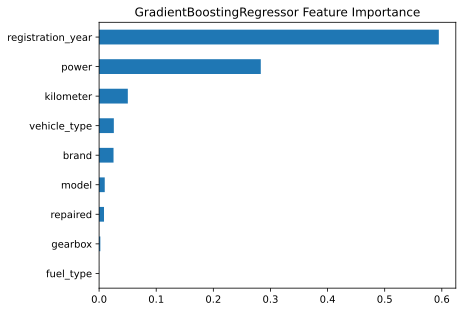

In [72]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):
    parameters = {'max_depth' : 8, 'n_estimators': 10, 'criterion':'mse', 'learning_rate': 0.15 }
    model = GradientBoostingRegressor(**parameters, random_state=RANDOM_FIX_NUMBER)
    GBR_model, fit_time = fit_model_time(model, features_train, target_train)
    GBR_pred, pred_time = predict_time(GBR_model, features_test)
    GBR_RMSE = np.sqrt(mean_squared_error(target_test, GBR_pred))

    info = f'(learning_rate: {GBR_model.learning_rate}, ' +\
           f'max_depth: {GBR_model.max_depth}, ' +\
           f'n_estimators: {GBR_model.n_estimators}, ' +\
           f'random_state: {GBR_model.random_state})'
    model_metrics(df_results, GBR_RMSE, fit_time, pred_time, info, 'GradientBoostingRegressor')

    # Построим таблицу важности обучающих признаков:
    pd.Series(index=features_train.columns, data=GBR_model.feature_importances_) \
        .sort_values() \
        .plot(kind='barh')
    _ = plt.title("GradientBoostingRegressor Feature Importance")

display(df_results)

**Промежуточные выводы:**

1. Найденная модель 'GradientBoostingRegressor' имеет значение MSE около 2100 и время обучения 4.2 секунды.
2. Значение 'max_depth' для такой модели равно 8, а n_estimators = 10.
3. Полученное MSE меньше требуемого значения 2500, время приемлемое. Оставляем 'n_estimators' = 10 и для следующих моделей.
4. Самыми важными для модели 'GradientBoostingRegressor' являются 2 признака:
* registration_year — год регистрации автомобиля.
* power — мощность (л. с.).

### Итеративные модели.

#### Модель градиентного бустинга *LightGBM* .

  0%|          | 0/1 [00:00<?, ?it/s]

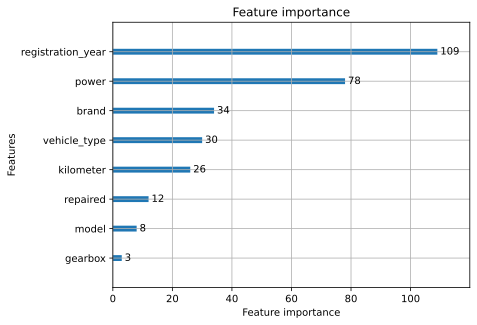

,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}
2,RandomForestRegressor+GridSearchCV,2065.648,7.601,0.000,"{'max_depth': 8, 'n_estimators': 10}"
3,GradientBoostingRegressor,2096.839,4.452,0.033,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
4,LGBMRegressor,2295.707,0.311,0.024,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"


In [73]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):
    model = LGBMRegressor(max_depth=8, n_estimators=10, random_state=RANDOM_FIX_NUMBER, 
                          learning_rate=0.15, objective='regression')
    begin = time.time()
    model.fit(features_train, target_train, eval_set=(features_test, target_test), verbose=0)
    fit_time = time.time() - begin
    LGBM_pred, pred_time = predict_time(model, features_test)
    LGBM_RMSE = np.sqrt(mean_squared_error(target_test, LGBM_pred)) 

    best_params = model.get_params()
    info = f'(learning_rate: {best_params["learning_rate"]}, ' +\
       f'max_depth: {best_params["max_depth"]}, ' +\
       f'n_estimators: {best_params["n_estimators"]}, ' +\
       f'random_state: {best_params["random_state"]})'
    model_metrics(df_results, LGBM_RMSE, fit_time, pred_time, info, 'LGBMRegressor')
              
plot_importance(model)
plt.show()
                      
display(df_results)

#### Модель градиентного бустинга *LightGBM* с функций GridSearchCV.

In [74]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):
    model = LGBMRegressor(random_state=RANDOM_FIX_NUMBER, 
                      learning_rate=0.15, objective='regression')

    parameters = {'max_depth': [8], 'n_estimators': [10]} 
    lgbm_grid_model = GridSearchCV(model, parameters, cv=3, 
                                   scoring='neg_root_mean_squared_error', verbose=0)    
    model, fit_time = fit_model_time(lgbm_grid_model, features_train, target_train)  
    LGBM_pred, pred_time = predict_time(model, features_test)
    LGBM_RMSE = np.sqrt(mean_squared_error(target_test, LGBM_pred)) 

    model_metrics(df_results, LGBM_RMSE, fit_time, pred_time, 
                  model.best_params_, 'LGBMRegressor+GridSearchCV')

display(df_results)

  0%|          | 0/1 [00:00<?, ?it/s]

,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}
2,RandomForestRegressor+GridSearchCV,2065.648,7.601,0.000,"{'max_depth': 8, 'n_estimators': 10}"
3,GradientBoostingRegressor,2096.839,4.452,0.033,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
4,LGBMRegressor,2295.707,0.311,0.024,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
5,LGBMRegressor+GridSearchCV,2295.707,1.066,0.026,"{'max_depth': 8, 'n_estimators': 10}"


**Промежуточные выводы:**

1. Найденная модель 'LGBMRegressor' для выбранных нами сравнительных значениях гиперпараметров {'max_depth' = 8, а n_estimators = 10} имеет значение MSE около 2300 и время обучения 1.3 секунды.
2. Полученное MSE меньше требуемого значения 2500, время приемлемое.
3. Самыми важными для модели 'LGBMRegressor' являются 2 признака:
* registration_year — год регистрации автомобиля.
* power — мощность (л. с.).

#### Модель градиентного бустинга *CatBoost* .

  0%|          | 0/1 [00:00<?, ?it/s]

,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}
2,RandomForestRegressor+GridSearchCV,2065.648,7.601,0.000,"{'max_depth': 8, 'n_estimators': 10}"
3,GradientBoostingRegressor,2096.839,4.452,0.033,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
4,LGBMRegressor,2295.707,0.311,0.024,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
5,LGBMRegressor+GridSearchCV,2295.707,1.066,0.026,"{'max_depth': 8, 'n_estimators': 10}"
6,CatBoostRegressor,2349.345,0.538,0.006,"{'iterations': 10, 'learning_rate': 0.15, 'depth': 8, 'loss_function': 'RMSE', 'random_state': 12345}"


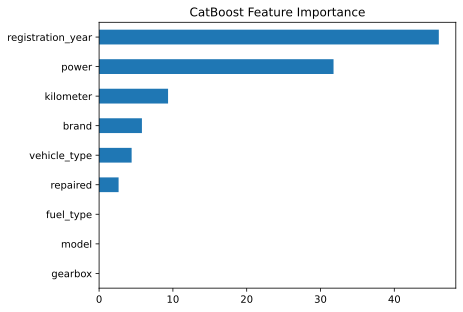

In [75]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):
    model = CatBoostRegressor(random_state=RANDOM_FIX_NUMBER, loss_function="RMSE", 
                              depth=8, iterations=10, learning_rate=0.15)   
    begin = time.time()
    model.fit(features_train, target_train, 
              eval_set=(features_test, target_test), 
              verbose=False)
    fit_time = time.time() - begin
    
    CatBR_pred, pred_time = predict_time(model, features_test)
    CatBR_RMSE = np.sqrt(mean_squared_error(target_test, CatBR_pred)) 

    model_metrics(df_results, CatBR_RMSE, fit_time, pred_time, 
                  model.get_params(), 'CatBoostRegressor')

# Построим таблицу важности обучающих признаков:
pd.Series(index=model.feature_names_, data=model.feature_importances_) \
    .sort_values() \
    .plot(kind='barh')
_ = plt.title("CatBoost Feature Importance")
    
                      
display(df_results)

#### Модель градиентного бустинга *CatBoost* + GridSearchCV.

Для получения лучшей модели градиентного бустинга *CatBoost* будем автоматически подбирать гиперпараметры с помощью функции GridSearchCV. 

In [76]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):
    parameters = {'depth': [8], 'iterations': [10], 'verbose': [10]}
    model = CatBoostRegressor(random_state=RANDOM_FIX_NUMBER,
                              learning_rate=0.15, early_stopping_rounds=10)
    
    # подберём гиперпараметры с помощью GridSearchCV
    cat_boost_grid = GridSearchCV(model, parameters, cv=3, n_jobs=-1,
                     scoring='neg_root_mean_squared_error')
    
    model, fit_time = fit_model_time(cat_boost_grid, features_train, target_train)  
    
    CatBR_pred, pred_time = predict_time(model, features_test)
    CatBR_RMSE = np.sqrt(mean_squared_error(target_test, CatBR_pred)) 

    model_metrics(df_results, CatBR_RMSE, fit_time, pred_time, 
                  model.best_params_, 'CatBoostRegressor+GridSearchCV')
    
display(df_results)

  0%|          | 0/1 [00:00<?, ?it/s]

0:	learn: 4067.6096908	total: 26.7ms	remaining: 240ms
9:	learn: 2339.6474715	total: 255ms	remaining: 0us


,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}
2,RandomForestRegressor+GridSearchCV,2065.648,7.601,0.000,"{'max_depth': 8, 'n_estimators': 10}"
3,GradientBoostingRegressor,2096.839,4.452,0.033,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
4,LGBMRegressor,2295.707,0.311,0.024,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
5,LGBMRegressor+GridSearchCV,2295.707,1.066,0.026,"{'max_depth': 8, 'n_estimators': 10}"
6,CatBoostRegressor,2349.345,0.538,0.006,"{'iterations': 10, 'learning_rate': 0.15, 'depth': 8, 'loss_function': 'RMSE', 'random_state': 12345}"
7,CatBoostRegressor+GridSearchCV,2349.345,3.984,0.005,"{'depth': 8, 'iterations': 10, 'verbose': 10}"


**Промежуточные выводы:**

1. Найденная модель 'CatBoostRegressor' для выбранных нами сравнительных значениях гиперпараметров {'max_depth' = 8, а iterations = 10} имеет значение MSE около 2350 и время обучения 2.5 секунды.
2. Полученное MSE меньше требуемого значения 2500, время приемлемое.
3. Самыми важными для модели 'CatBoostRegressor' являются 2 признака:
* registration_year — год регистрации автомобиля.
* power — мощность (л. с.).

#### Модель градиентного бустинга *XGBoost*.

  0%|          | 0/1 [00:00<?, ?it/s]

,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}
2,RandomForestRegressor+GridSearchCV,2065.648,7.601,0.000,"{'max_depth': 8, 'n_estimators': 10}"
3,GradientBoostingRegressor,2096.839,4.452,0.033,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
4,LGBMRegressor,2295.707,0.311,0.024,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
5,LGBMRegressor+GridSearchCV,2295.707,1.066,0.026,"{'max_depth': 8, 'n_estimators': 10}"
6,CatBoostRegressor,2349.345,0.538,0.006,"{'iterations': 10, 'learning_rate': 0.15, 'depth': 8, 'loss_function': 'RMSE', 'random_state': 12345}"
7,CatBoostRegressor+GridSearchCV,2349.345,3.984,0.005,"{'depth': 8, 'iterations': 10, 'verbose': 10}"
8,XGBRegressor,1811.145,0.983,0.013,"(max_depth: 8, n_estimators: 10, random_state: 12345)"


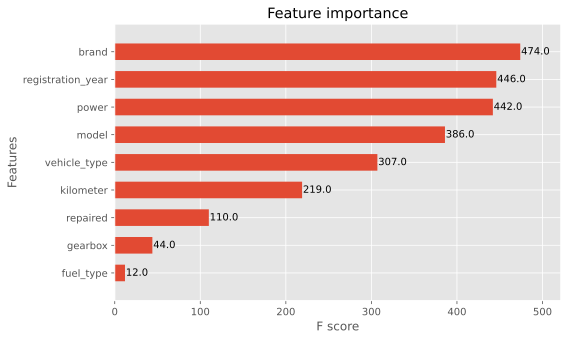

In [77]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):  
    
    max_depth_my, n_estimators_my = 8, 10
    model_xgb_regressor = xgb.XGBRegressor(max_depth=max_depth_my,
                                           n_estimators=n_estimators_my,
                                           random_state=RANDOM_FIX_NUMBER
                                          )  
    begin = time.time()
    model_xgb_regressor.fit(features_train, target_train, 
                            eval_set=[(features_test, target_test)], 
                            eval_metric="mae", verbose=0)
    fit_time = time.time() - begin
    
    xgb_pred, pred_time = predict_time(model_xgb_regressor, features_test)
    xgb_RMSE = np.sqrt(mean_squared_error(target_test, xgb_pred)) 
       
    info = f'(max_depth: {max_depth_my}, n_estimators: {n_estimators_my}, ' +\
           f'random_state: {RANDOM_FIX_NUMBER})'
    
with plt.style.context("ggplot"):
    fig = plt.figure(figsize=(8,5))
    ax = fig.add_subplot()
    xgb.plotting.plot_importance(model_xgb_regressor, ax=ax, 
                                 height=0.6, importance_type="weight")
    
model_metrics(df_results, xgb_RMSE, fit_time, pred_time, info, 'XGBRegressor')

#### Модель градиентного бустинга *XGBoost* с использованием GridSearch.

In [78]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):  
    
    params = {'max_depth': [8], 'n_estimators': [10], 'eta': [1]}
    grid_search = GridSearchCV(xgb.XGBRFRegressor(random_state=RANDOM_FIX_NUMBER), 
                               params, n_jobs=-1, cv=3)
    model, fit_time = fit_model_time(
        grid_search, features_train, target_train)
   
    xgb_pred, pred_time = predict_time(model, features_test)
    xgb_RMSE = np.sqrt(mean_squared_error(target_test, xgb_pred)) 

model_metrics(df_results, xgb_RMSE, fit_time, pred_time, 
              model.best_params_, 'XGBRegressor+GridSearchCV')

  0%|          | 0/1 [00:00<?, ?it/s]

,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}
2,RandomForestRegressor+GridSearchCV,2065.648,7.601,0.000,"{'max_depth': 8, 'n_estimators': 10}"
3,GradientBoostingRegressor,2096.839,4.452,0.033,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
4,LGBMRegressor,2295.707,0.311,0.024,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
5,LGBMRegressor+GridSearchCV,2295.707,1.066,0.026,"{'max_depth': 8, 'n_estimators': 10}"
6,CatBoostRegressor,2349.345,0.538,0.006,"{'iterations': 10, 'learning_rate': 0.15, 'depth': 8, 'loss_function': 'RMSE', 'random_state': 12345}"
7,CatBoostRegressor+GridSearchCV,2349.345,3.984,0.005,"{'depth': 8, 'iterations': 10, 'verbose': 10}"
8,XGBRegressor,1811.145,0.983,0.013,"(max_depth: 8, n_estimators: 10, random_state: 12345)"
9,XGBRegressor+GridSearchCV,2028.201,4.152,0.016,"{'eta': 1, 'max_depth': 8, 'n_estimators': 10}"


**Промежуточные выводы:**

1. Найденная модель 'XGBRegressor' для выбранных нами сравнительных значениях гиперпараметров {'max_depth' = 8, а n_estimators' = 10} имеет значение MSE около 1810 и время обучения 1.3 секунды.
2. Полученное MSE меньше требуемого значения 2500, время приемлемое.
3. Самыми важными для модели 'XGBRegressor' являются 2 признака:
* registration_year — год регистрации автомобиля.
* power — мощность (л. с.).

#### Константная модель. Проверка модели на адекватность.

In [79]:
# Чтобы видеть, что процесс выполняется, поставим tqdm с разовым циклом:
for _ in tqdm(range(1)):
    model_dum = DummyRegressor(strategy="mean")

    dum_model, fit_time = fit_model_time(
        model_dum, features_train, target_train)
    dum_pred, pred_time = predict_time(dum_model, features_test)
    dum_RMSE = np.sqrt(mean_squared_error(target_test,dum_pred))
    
model_metrics(df_results, dum_RMSE, fit_time, pred_time, 
              'No', 'DummyRegressor')

  0%|          | 0/1 [00:00<?, ?it/s]

,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}
2,RandomForestRegressor+GridSearchCV,2065.648,7.601,0.000,"{'max_depth': 8, 'n_estimators': 10}"
3,GradientBoostingRegressor,2096.839,4.452,0.033,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
4,LGBMRegressor,2295.707,0.311,0.024,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
5,LGBMRegressor+GridSearchCV,2295.707,1.066,0.026,"{'max_depth': 8, 'n_estimators': 10}"
6,CatBoostRegressor,2349.345,0.538,0.006,"{'iterations': 10, 'learning_rate': 0.15, 'depth': 8, 'loss_function': 'RMSE', 'random_state': 12345}"
7,CatBoostRegressor+GridSearchCV,2349.345,3.984,0.005,"{'depth': 8, 'iterations': 10, 'verbose': 10}"
8,XGBRegressor,1811.145,0.983,0.013,"(max_depth: 8, n_estimators: 10, random_state: 12345)"
9,XGBRegressor+GridSearchCV,2028.201,4.152,0.016,"{'eta': 1, 'max_depth': 8, 'n_estimators': 10}"


**Промежуточные выводы:**

Ошибка на моделях с тестовой выборкой меньше, чем на константной модели.  
Все в порядке.

### Промежуточные выводы по разделу 'Обучение моделей'.

1.Исходные данные поделены на обучающую и тестовую выборки в пропорции 4:1.  

2.Для оценки качества моделей использовали метрику RMSE.  

3.Созданы и обучены следующие модели:  
* Линейная регрессия.  
* Случайного дерева 'Decision Tree' с подбором глубины дерева.  
* 'Cлучайного леса' c подбором гиперпараметров методом GridSearchCV.  
* GradientBoostingRegressor.  
* Градиентного бустинга LightGBM.  
* Градиентного бустинга LightGBM с функций GridSearchCV.
* Градиентного бустинга CatBoost.   
* Градиентного бустинга CatBoost + GridSearchCV.  
* Градиентного бустинга XGBoost.  
* Градиентного бустинга XGBoost + GridSearchCV.  

4.Практически все разработанные модели, кроме 'Линейной регрессии', имеют метрику MSE, удовлетворяющую требованию задания на проект: "Значение метрики RMSE должно быть меньше 2500."

5.Сравнения проводились на моделях с гиперпараметрами: 'max_depth' = 8, 'n_estimators' = 10, 'iterations' = 10.

6.Время предсказания настолько мало по сравнению с временем на обучение, что его можно и не учитывать. 

7.Проверка модели на адекватность проведена на константной модели. Полученное значение ошибки выше, чем на любой рабочей модели.  

8.Самыми важными для всех моделей являются 2 признака:  
* registration_year — год регистрации автомобиля.  
* power — мощность (л. с.).  

Интересно отметить, что при проверке на мультиколлинеарность эти же признаки давали самое большое значение коэффициент Пирсона. Для пары ‘registration_year’ – ‘price’ он равен 0.44, а для пары ‘power’ – ‘price’: 0.5.  
Таким образом, отмечаем соответствие результатов проверки на мультиколлинеарность и определению самых важных признаков для расчёта стоимости автомобиля.

9.Результаты, собранные по различным моделям приведены в таблице:

In [80]:
display(df_results)

,model,RMSE,"fitting time, с","prediction time, с",Parameters
0,Linear regression,3196.222,0.108,0.007,No
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}
2,RandomForestRegressor+GridSearchCV,2065.648,7.601,0.000,"{'max_depth': 8, 'n_estimators': 10}"
3,GradientBoostingRegressor,2096.839,4.452,0.033,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
4,LGBMRegressor,2295.707,0.311,0.024,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
5,LGBMRegressor+GridSearchCV,2295.707,1.066,0.026,"{'max_depth': 8, 'n_estimators': 10}"
6,CatBoostRegressor,2349.345,0.538,0.006,"{'iterations': 10, 'learning_rate': 0.15, 'depth': 8, 'loss_function': 'RMSE', 'random_state': 12345}"
7,CatBoostRegressor+GridSearchCV,2349.345,3.984,0.005,"{'depth': 8, 'iterations': 10, 'verbose': 10}"
8,XGBRegressor,1811.145,0.983,0.013,"(max_depth: 8, n_estimators: 10, random_state: 12345)"
9,XGBRegressor+GridSearchCV,2028.201,4.152,0.016,"{'eta': 1, 'max_depth': 8, 'n_estimators': 10}"


## Анализ моделей.

Удалим из результирующей таблицы строки с результатами по 'DummyRegressor' и 'Linear regression', как неинформативные.

In [81]:
# Сделаем копию нашего дата сета:
df_res = df_results.copy(deep=True)

# Соберём список моделей для удаления:
list_for_delete = ['Linear regression', 'DummyRegressor']

for name_model in list_for_delete:
    df_res = df_res.loc[df_res['model'] != name_model]

df_res

,model,RMSE,"fitting time, с","prediction time, с",Parameters
1,DecisionTreeRegressor+GridSearchCV,2128.983,1.178,0.000,{'max_depth': 8}
2,RandomForestRegressor+GridSearchCV,2065.648,7.601,0.000,"{'max_depth': 8, 'n_estimators': 10}"
3,GradientBoostingRegressor,2096.839,4.452,0.033,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
4,LGBMRegressor,2295.707,0.311,0.024,"(learning_rate: 0.15, max_depth: 8, n_estimators: 10, random_state: 12345)"
5,LGBMRegressor+GridSearchCV,2295.707,1.066,0.026,"{'max_depth': 8, 'n_estimators': 10}"
6,CatBoostRegressor,2349.345,0.538,0.006,"{'iterations': 10, 'learning_rate': 0.15, 'depth': 8, 'loss_function': 'RMSE', 'random_state': 12345}"
7,CatBoostRegressor+GridSearchCV,2349.345,3.984,0.005,"{'depth': 8, 'iterations': 10, 'verbose': 10}"
8,XGBRegressor,1811.145,0.983,0.013,"(max_depth: 8, n_estimators: 10, random_state: 12345)"
9,XGBRegressor+GridSearchCV,2028.201,4.152,0.016,"{'eta': 1, 'max_depth': 8, 'n_estimators': 10}"


### Представим все отработанные модели на графике.

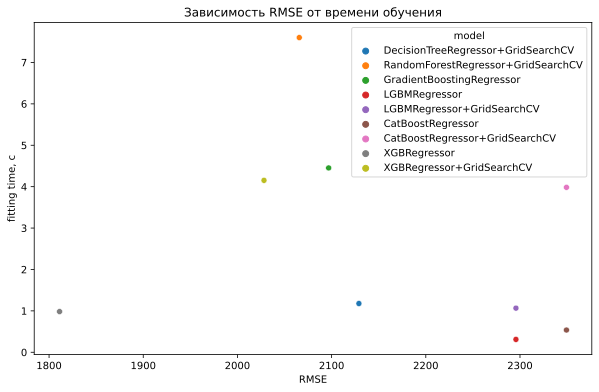

In [82]:
plt.figure(figsize = (10,6))
sns.scatterplot(data = df_res ,x ='RMSE', y='fitting time, с', hue="model")
plt.title('Зависимость RMSE от времени обучения')
plt.show()

**Отмечаем:**
1. Наилучшей по параметрам 'качество - время' является модель XGBRegressor	с RSME=1811	и временем обучения 1.0 секунда.   
2. Модель имеет следующие гиперпараметры: 'learning_rate' = 0.15, 'max_depth' = 8, 'n_estimators'  = 10, 'random_state' = 12345.

### Зависимость RSME от гиперпараметров на примере лучшей модели.

In [83]:
# создадим вспомогательную функцию:
def BEST_model(max_depth_my, n_estimators_my):
    '''
    функция обеспечивает создание и обучение модели 
    градиентного бустинга LGBMRegressor согласно передаваемым параметрам.
    '''
    model_xgb_regressor = xgb.XGBRegressor(max_depth=max_depth_my,
                                           n_estimators=n_estimators_my,
                                           random_state=RANDOM_FIX_NUMBER
                                          )  
    model_xgb_regressor.fit(features_train, target_train, 
                            eval_set=[(features_test, target_test)], 
                            eval_metric="mae", verbose=0)
    
    xgb_pred, pred_time = predict_time(model_xgb_regressor, features_test)
    xgb_RMSE = np.sqrt(mean_squared_error(target_test, xgb_pred)) 
          
    return model_xgb_regressor, xgb_RMSE

#### Покажем зависимость RMSE от глубины дерева.

  0%|          | 0/1 [00:00<?, ?it/s]

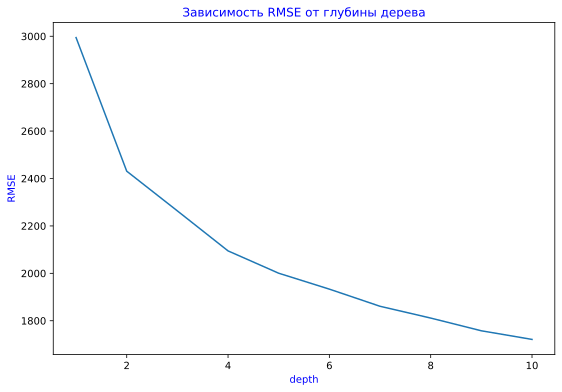

In [84]:
variable_param = 'depth'
df_res_depth = pd.DataFrame(columns=[variable_param, 'RMSE'])

for _ in tqdm(range(1)):
    for dep in range(1, 11):
        model_xgb_regressor, best_RMSE = BEST_model(dep, 10)
        best_params = model_xgb_regressor.get_params()
        df_res_depth.loc[len(df_res_depth.index )] = \
            [best_params["max_depth"], best_RMSE]

plt.figure(figsize = (9,6))
plt.plot(df_res_depth[variable_param], df_res_depth['RMSE'])
plt.title('Зависимость RMSE от глубины дерева', color='blue')
plt.xlabel(variable_param, color='blue')
plt.ylabel('RMSE', color='blue')
plt.show()

Отмечаем зависимость, близкую к экспоненциальной. Увеличение глубины дерева помогает получить лучшее качество модели.

#### Покажем зависимость RMSE от 'n_estimators' - количества оценщиков.

  0%|          | 0/1 [00:00<?, ?it/s]

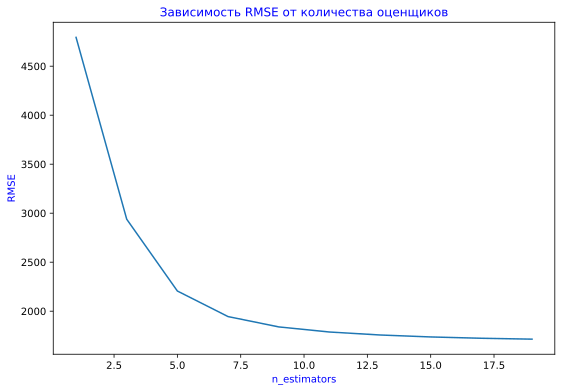

In [85]:
variable_param = 'n_estimators'
df_res_est = pd.DataFrame(columns=[variable_param, 'RMSE'])

for _ in tqdm(range(1)):
    for est in range(1, 21, 2):
        model_xgb_regressor, best_RMSE = BEST_model(8, est)
        best_params = model_xgb_regressor.get_params()
        df_res_est.loc[len(df_res_est.index )] = \
            [best_params[variable_param], best_RMSE]

plt.figure(figsize = (9,6))
plt.plot(df_res_est[variable_param], df_res_est['RMSE'])
plt.title('Зависимость RMSE от количества оценщиков', color='blue')
plt.xlabel(variable_param, color='blue')
plt.ylabel('RMSE', color='blue')
plt.show()

* Отмечаем обратную зависимость. 
* Увеличение числа 'n_estimators' помогает получить лучшее качество модели.

### Промежуточные выводы по разделу 'Анализ моделей'.

1. Наилучшей по параметрам 'качество - время' является модель XGBRegressor	с RSME=1811	и временем обучения 1.0 секунда.  
2. Модель имеет следующие гиперпараметры: 'learning_rate' = 0.15, 'max_depth' = 8, 'n_estimators'  = 10, 'random_state' = 12345.
3. Рассмотрены зависимости RSME от гиперпараметров на примере лучшей модели:
* Зависимость RMSE от ‘depth’ - глубины дерева.  
Отмечаем зависимость, близкую к экспоненциальной. Увеличение глубины дерева помогает получить лучшее качество модели.  
* Зависимость RMSE от 'n_estimators' - количества оценщиков.   
Получили обратную зависимость. Увеличение числа 'n_estimators' помогает получить лучшее качество модели.  

## Общие выводы.

1.Проведено исследование с целью построения оптимальной модели машинного обучения, для определения рыночной стоимости автомобиля.
* Результаты исследования позволят сервису по продаже автомобилей разработать приложение для привлечения новых клиентов.
* Входные данные: исторические данные - технические характеристики, комплектации и цены автомобилей.

2.Для подготовки данных к последующей обработке были проведены следующие операции:
* Загрузка локального и удаленного файла с данными.
* Выяснили, что объем данных довольно большой: 354 369 строк х 16 столбцов.
* Названия столбцов откорректированы и приведены к стилю snake_case.
* Дубликаты в количестве 4 штуки исключены.
* Удалены неинформативные признаки.
* Изучены количественные признаки. Аномальные значения удалены.
* Проверены категориальные признаки. Пустые значения заполнены.
* Проведено кодирование категориальных принаков (перевод в численные).
* Выполнено масштабирование численных признаков.
* Проверка количества оставшихся после всех сокращений данных. Сохранено более 90% данных.

3.Созданы и обучены следующие модели:
* Линейная регрессия.
* Случайного дерева 'Decision Tree' с подбором глубины дерева.
* 'Cлучайного леса' c подбором гиперпараметров методом GridSearchCV.
* GradientBoostingRegressor.
* Градиентного бустинга LightGBM.
* Градиентного бустинга LightGBM с функций GridSearchCV.
* Градиентного бустинга CatBoost.
* Градиентного бустинга CatBoost + GridSearchCV.
* Градиентного бустинга XGBoost.
* Градиентного бустинга XGBoost + GridSearchCV.  
Все они имеют значение RSME ниже контрольной величины 2500.

4.Самыми важными для всех моделей являются 2 признака:
* registration_year — год регистрации автомобиля.
* power — мощность (л. с.).

5.Проверка модели на адекватность выполнена на константной модели. Полученное значение ошибки выше, чем на любой из рабочей модели.

6.Наилучшей по параметрам 'качество - время создания и обучения' является модель ‘XGBRegressor’:
* Значение RSME равно 1811.
* Время обучения 1.0 секунда. 
* Лучшая модель имеет следующие гиперпараметры: 'learning_rate' = 0.15, 'max_depth' = 8, 'n_estimators'  = 10, 'random_state' = 12345.

7.Рассмотрены зависимости RSME от гиперпараметров на примере лучшей модели.

8.Специалистам сервиса по продаже автомобилей можно рекомендовать использовать модель ‘XGBRegressor’.

## Чек-лист проверки

Поставьте 'x' в выполненных пунктах. Далее нажмите Shift+Enter.

- [x]  Jupyter Notebook открыт
- [x]  Весь код выполняется без ошибок
- [x]  Ячейки с кодом расположены в порядке исполнения
- [x]  Выполнена загрузка и подготовка данных
- [x]  Выполнено обучение моделей
- [x]  Есть анализ скорости работы и качества моделей

[Вернутся к общему списку проектов курса “Data Science” Яндекс-практикума](../README.md)